In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib
matplotlib.style.use('ggplot')
import pandas as pd

In [2]:
import diffimTests as dit
#reload(dit)

testObj = dit.DiffimTest(varFlux2=np.repeat(2000, 20), 
                         #varFlux2=np.repeat(620*np.sqrt(2), 20),
                         n_sources=600, verbose=True, sourceFluxRange=(2000., 120000.), 
                         psf_yvary_factor=0.5, psfSize=13)
res = testObj.runTest(spatialKernelOrder=2)
print res

Template PSF: [1.6, 1.6] 0.0
Science PSF: [1.8, 2.2] -45.0
0.824621125124
Offset: [0.0, 0.0]
PSF y spatial-variation: -0.492813481453 0.493450410102
Variable source: 11 481.504254729 446.769330925 0 2000
Variable source: 6 60.2485291279 35.3191743182 0 2000
Variable source: 19 441.050733817 436.806559587 0 2000
Variable source: 20 446.291646029 86.4683838602 0 2000
Variable source: 1 66.5809759253 424.38486369 0 2000
Variable source: 12 466.843050607 342.354052063 0 2000
Variable source: 17 45.6530981449 331.260325215 0 2000
Variable source: 10 302.643969883 44.7418294743 0 2000
Variable source: 0 368.142255845 436.045411845 0 2000
Variable source: 13 146.056622889 434.017042329 0 2000
Variable source: 5 396.07140698 121.296576813 0 2000
Variable source: 21 245.245586804 439.913841214 0 2000
Variable source: 24 129.950748293 390.033308509 0 2000
Variable source: 4 431.666157472 255.180259503 0 2000
Variable source: 8 277.951989376 82.2791446766 0 2000
Variable source: 22 233.327308185 

In [3]:
import lsst.afw.geom as afwGeom

exposure = testObj.im2.asAfwExposure()
template = testObj.im1.asAfwExposure()

exposure.setPsf(testObj.variablePsf.getCoaddPsf(exposure))
exposure.getPsf().computeKernelImage(afwGeom.Point2D(28., 66.)).getDimensions()

Extent2I(27, 25)

A&L(dec): stats(mean=0.11608639, stdev=24.692617, min=-162.86592, max=252.57611)
Zogy: stats(mean=0.0712106, stdev=24.9333, min=-766.08795, max=920.04163)
A&L(dec) - Zogy: stats(mean=0.008017364, stdev=2.7184396, min=-509.36853, max=760.64014)
A&L(dec) - A&L: stats(mean=-0.03347978, stdev=6.8337188, min=-45.460281, max=70.804291)
Scorr: stats(mean=3.9852544e-06, stdev=0.00026903153, min=-0.014586432, max=0.013801034)
Scorr_var: stats(mean=0.00025189554, stdev=1.4065441e-06, min=0.0002467375, max=0.00095368025)


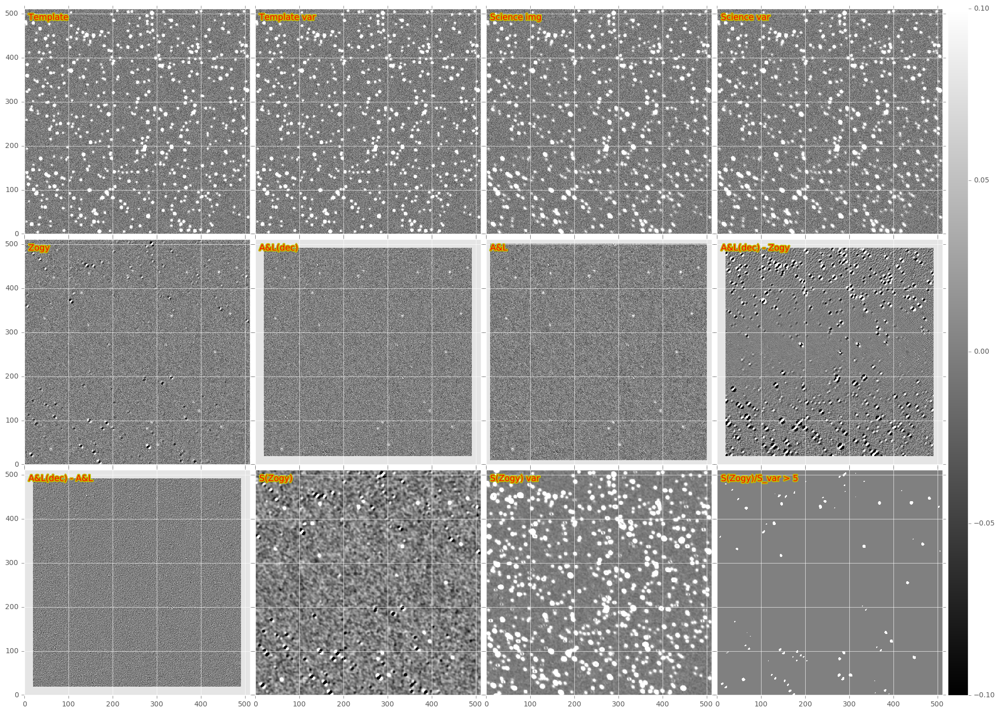

In [4]:
#dit.plotImageGrid((testObj.im1.im, testObj.im2.im), imScale=8)
testObj.doPlot(imScale=6, include_Szogy=True);

In [5]:
import lsst.pex.config as pexConfig
import lsst.afw.image as afwImage
import lsst.afw.geom as afwGeom
import lsst.afw.math as afwMath
import lsst.meas.algorithms as measAlg
import lsst.pipe.base as pipeBase
import lsst.ip.diffim as ipDiffim

In [6]:
def ga(exposure):
    return exposure.getMaskedImage().getImage().getArray()
def gv(exposure):
    return exposure.getMaskedImage().getVariance().getArray()

In [7]:
#import testPsfexPsfEDITED as tpp
#reload(tpp)

exposure2 = testObj.im2.asAfwExposure()
#res = dit.tasks.doMeasurePsf(exposure2) #, psfMeasureConfig=config)
#psf = res.psf
obj = dit.tasks.PsfMeasurement(exposure2)
obj.run()
psf = obj.exposure.getPsf()
exposure2.setPsf(psf)

template2 = testObj.im1.asAfwExposure()
#res = dit.tasks.doMeasurePsf(template2) #, psfMeasureConfig=config)
#psf = res.psf
obj = dit.tasks.PsfMeasurement(template2)
obj.run()
psf = obj.exposure.getPsf()
template2.setPsf(psf)

539
538


In [8]:
ALres = dit.tasks.doAlInStack(template2, exposure2, doWarping=False, doDecorr=True, doPreConv=False,
            spatialBackgroundOrder=0, spatialKernelOrder=2)

In [9]:
config = dit.DecorrelateALKernelMapReduceConfig()
#config.gridStepX = config.gridStepY = 5
#config.gridSizeX = config.gridSizeY = 7
config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
#task = ipDiffim.ImageMapReduceTask(config=config)
print config

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


In [10]:
res = task.run(ALres.subtractedExposure, template=template2, science=exposure2,
                  alTaskResult=ALres, forceEvenSized=True)
newExpC = res.exposure

In [11]:
testObj2 = testObj.clone()
testObj2.ALres.decorrelatedDiffim = newExpC
testObj2.runTest(spatialKernelOrder=2)

{'ALstack': {'FN': 0, 'FP': 0, 'TP': 20},
 'ALstack_decorr': {'FN': 2, 'FP': 0, 'TP': 18},
 'SZogy': {'FN': 2, 'FP': 29, 'TP': 18},
 'Zogy': {'FN': 1, 'FP': 34, 'TP': 19}}

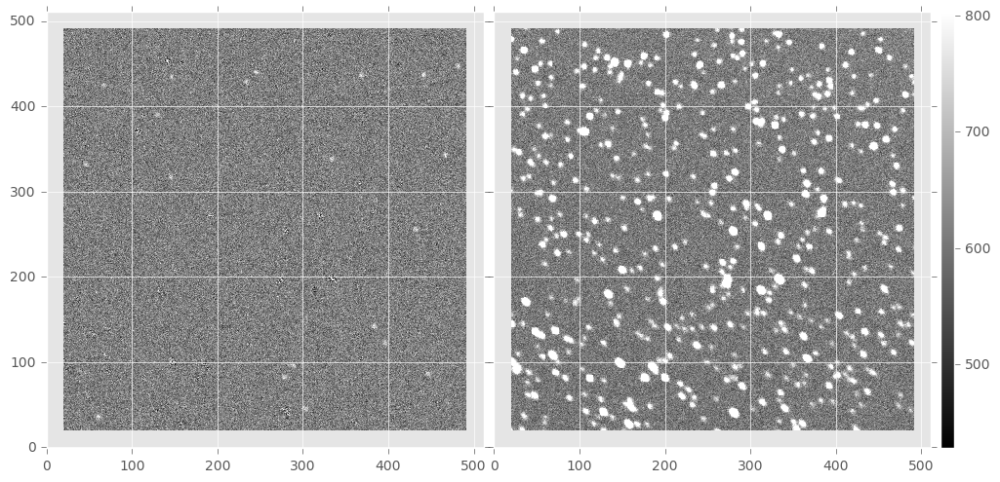

In [12]:
dit.plotImageGrid((newExpC, newExpC.getMaskedImage().getVariance()), imScale=6)

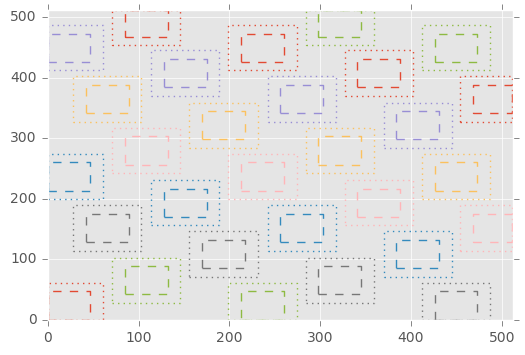

In [13]:
task.plotBoxes(newExpC.getBBox(), 5)

Finally, let's compare it to spatially-varying ZOGY!

NOTE that the `gridStep/gridSize` combo doesn't seem to correctly fully cover the entire image in all cases! In this case (the default), it does, but if I uncomment the 'gridStep' setting line below, it doesn't.

In [14]:
config = dit.ZogyMapReduceConfig()
#config.gridStepX = config.gridStepY = 9
#config.gridSizeX = config.gridSizeY = 10
config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


In [15]:
newExpZ = task.run(exposure2, template=template2, inImageSpace=False,
                       Scorr=False, forceEvenSized=True).exposure
newExpZ_Scorr = task.run(exposure2, template=template2, inImageSpace=False,
                       Scorr=True, forceEvenSized=True).exposure

In [16]:
testObj3 = testObj.clone()
testObj3.ALres.decorrelatedDiffim = newExpC
testObj3.D_Zogy = newExpZ  #dit.Exposure(ga(newExpZ), testObj.D_Zogy.psf, gv(newExpZ))
testObj3.S_Zogy = newExpZ_Scorr  #dit.Exposure(ga(newExpZ_Scorr), dit.psf.afwPsfToArray(newExpZ_Scorr.getPsf()), gv(newExpZ_Scorr))
testObj3.runTest(spatialKernelOrder=2)

{'ALstack': {'FN': 0, 'FP': 0, 'TP': 20},
 'ALstack_decorr': {'FN': 2, 'FP': 0, 'TP': 18},
 'SZogy': {'FN': 0, 'FP': 0, 'TP': 20},
 'Zogy': {'FN': 0, 'FP': 0, 'TP': 20}}

A&L(dec): stats(mean=0.11799736, stdev=24.61161, min=-164.08002, max=256.78632)
Zogy: stats(mean=0.062848262, stdev=24.839464, min=-343.39426, max=297.7673)
A&L(dec) - Zogy: stats(mean=0.039931569, stdev=28.820517, min=-258.33334, max=237.18842)
A&L(dec) - A&L: stats(mean=-0.032931708, stdev=6.7740631, min=-47.245255, max=70.115891)
Scorr: stats(mean=1.4689194e-06, stdev=0.00025058389, min=-0.0026853129, max=0.0045413231)
Scorr_var: stats(mean=0.00024780285, stdev=1.2374662e-05, min=0.00022234186, max=0.00091328984)


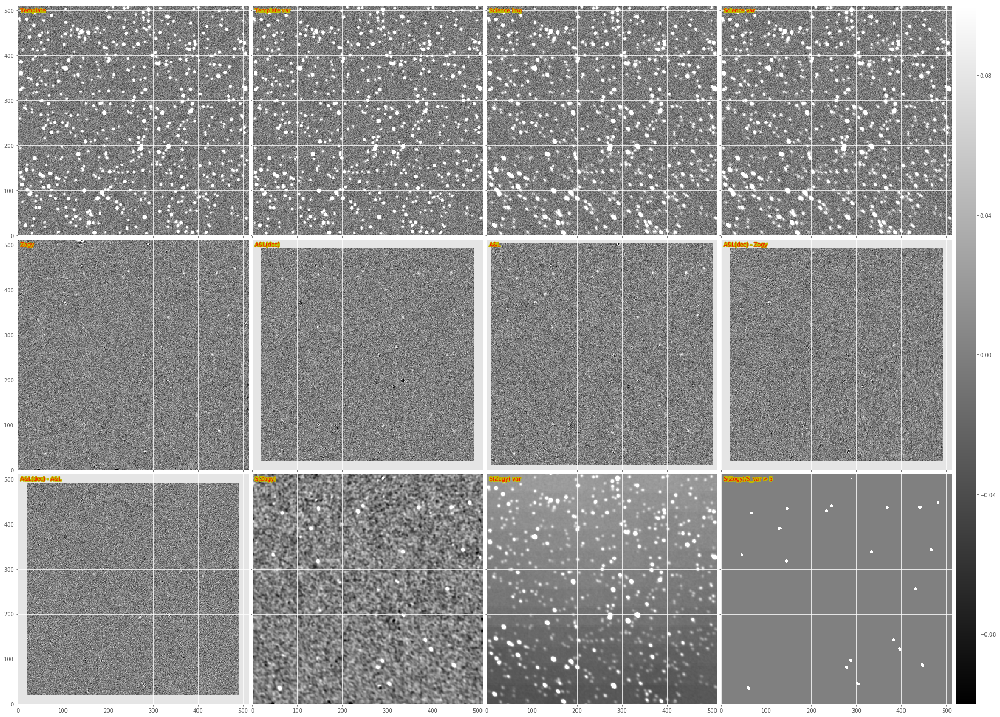

In [17]:
testObj3.doPlot(imScale=8, include_Szogy=True); #, centroidCoord=[424,66]);

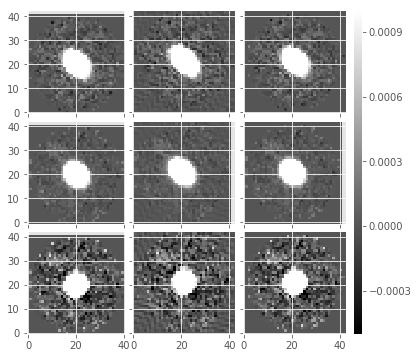

In [18]:
def gp(exp, coord):
    return exp.getPsf().computeImage(afwGeom.Point2D(coord[0], coord[1])).getArray()
    
dit.plotImageGrid((gp(exposure2, [80,80]), gp(newExpC, [80,80]), gp(newExpZ, [80,80]),
                   gp(exposure2, [255,255]), gp(newExpC, [255,255]), gp(newExpZ, [255,255]),
                   gp(exposure2, [480,480]), gp(newExpC, [480,480]), gp(newExpZ, [480,480]),), 
                  clim=(-0.0005, 0.001), nrows_ncols=(3, 3))

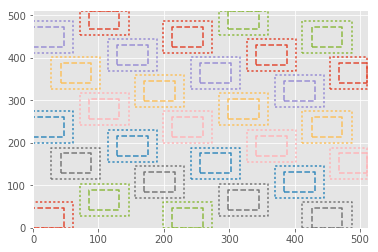

In [19]:
task.plotBoxes(exposure2.getBBox(), skip=5)

In [20]:
print task.mapperSubtask._DefaultName
print task.reducerSubtask._DefaultName

diffimTests_ZogyMapperSubtask
ip_diffim_ImageReducerSubtask


Try new method of just creating a spatially-varying CoaddPsf and then use that...

In [42]:
class SpatialDecorrelateALKernelMapperSubtask(ipDiffim.DecorrelateALKernelTask, 
                                              dit.ImageMapperSubtask):
    ConfigClass = ipDiffim.DecorrelateALKernelConfig
    _DefaultName = 'ip_diffim_spatialDecorrelateALKernelMapper'

    def __init__(self, *args, **kwargs):
        ipDiffim.DecorrelateALKernelTask.__init__(self, *args, **kwargs)

    def run(self, subExposure, expandedSubExposure, fullBBox,
            template, science, alTaskResult=None, psfMatchingKernel=None,
            preConvKernel=None, returnDiffimPsf=False, **kwargs):

        templateExposure = template  # input template
        scienceExposure = science  # input science image
        if alTaskResult is None and psfMatchingKernel is None:
            raise ValueError('Both alTaskResult and psfMatchingKernel cannot be None')
        psfMatchingKernel = alTaskResult.psfMatchingKernel if alTaskResult is not None else psfMatchingKernel

        # subExp and expandedSubExp are subimages of the (un-decorrelated) diffim!
        # So here we compute corresponding subimages of templateExposure and scienceExposure
        subExp2 = scienceExposure.Factory(scienceExposure, expandedSubExposure.getBBox())
        subExp1 = templateExposure.Factory(templateExposure, expandedSubExposure.getBBox())

        # Prevent too much log INFO verbosity from DecorrelateALKernelTask.run
        #logLevel = self.log.getLevel()
        #self.log.setLevel(lsst.log.WARN)
        #res = ipDiffim.DecorrelateALKernelTask.run(self, subExp2, subExp1, expandedSubExposure,
        #                                           psfMatchingKernel)
        svar = ipDiffim.DecorrelateALKernelTask.computeVarianceMean(self, subExp2)
        tvar = ipDiffim.DecorrelateALKernelTask.computeVarianceMean(self, subExp1)

        kimg = afwImage.ImageD(psfMatchingKernel.getDimensions())
        bbox = subExposure.getBBox()
        xcen = (bbox.getBeginX() + bbox.getEndX()) / 2.
        ycen = (bbox.getBeginY() + bbox.getEndY()) / 2.
        psfMatchingKernel.computeImage(kimg, True, xcen, ycen)
        kernel = ipDiffim.DecorrelateALKernelTask._computeDecorrelationKernel(kappa=kimg.getArray(),
                                                                            svar=svar, tvar=tvar)
        
        if not returnDiffimPsf:
            kernelImg = afwImage.ImageD(kernel.shape[0], kernel.shape[1])
            kernelImg.getArray()[:, :] = kernel
            kern = afwMath.FixedKernel(kernelImg)
            maxloc = np.unravel_index(np.argmax(kernel), kernel.shape)
            kern.setCtrX(maxloc[0])
            kern.setCtrY(maxloc[1])
            
        else:  # Compute the subtracted exposure's updated psf
            psf = subExposure.getPsf().computeImage(afwGeom.Point2D(xcen, ycen)).getArray()
            psfc = ipDiffim.DecorrelateALKernelTask.computeCorrectedDiffimPsf(kernel, psf, svar=svar, tvar=tvar)
            psfcI = afwImage.ImageD(psfc.shape[0], psfc.shape[1])
            psfcI.getArray()[:, :] = psfc
            kern = afwMath.FixedKernel(psfcI)

        psf = measAlg.KernelPsf(psfcK)
        out = pipeBase.Struct(psf=psf, bbox=subExposure.getBBox())
        return out

class SpatialDecorrelateALKernelMapReduceConfig(dit.ImageMapReduceConfig):
    mapperSubtask = pexConfig.ConfigurableField(
        doc='A&L decorrelation subtask to run on each sub-image',
        target=SpatialDecorrelateALKernelMapperSubtask
    )

    reduceOperation = pexConfig.ChoiceField(
        dtype=str,
        doc="""Operation to use for reducing subimages into new image.""",
        default="coaddPsf",
        allowed={
            "none": """simply return a list of values and don't re-map results into
                       a new image (noop operation)""",
            "coaddPsf": """Instead of constructing an Exposure, take a list of returned
                       PSFs and use CoaddPsf to construct a single PSF that covers the
                       entire input exposure""",
        }
    )

In [43]:
config = SpatialDecorrelateALKernelMapReduceConfig()
#config.gridStepX = config.gridStepY = 5
#config.gridSizeX = config.gridSizeY = 7
config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'coaddPsf'  # should already be default
task = dit.ImageMapReduceTask(config=config)
print config

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reduceOperation': 'coaddPsf', 'reducerSubtask': {'reduceOperation': 'coaddPsf'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


In [49]:
def pp(psf, coord):
    return psf.computeImage(afwGeom.Point2D(coord[0], coord[1])).getArray()

<class 'lsst.meas.algorithms.algorithmsLib.CoaddPsf'>


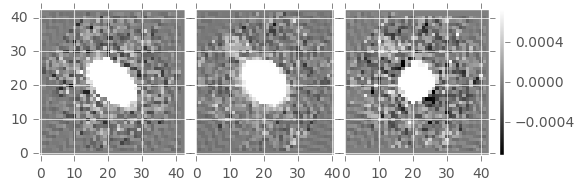

In [50]:
res = task.run(ALres.subtractedExposure, template=template2, science=exposure2,
                  alTaskResult=ALres, forceEvenSized=True, returnDiffimPsf=True)

print type(res.result)
psf = res.result
dit.plotImageGrid((pp(psf, [80,80]), pp(psf, [255,255]), pp(psf, [480,480])))

<class 'lsst.meas.algorithms.algorithmsLib.CoaddPsf'>


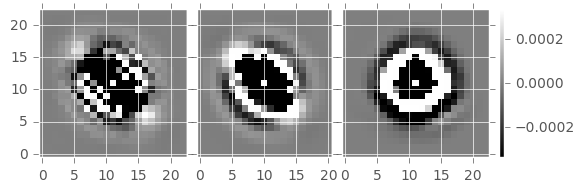

In [51]:
res = task.run(ALres.subtractedExposure, template=template2, science=exposure2,
                  alTaskResult=ALres, forceEvenSized=True)

print type(res.result)
psf = res.result
dit.plotImageGrid((pp(psf, [80,80]), pp(psf, [255,255]), pp(psf, [480,480])))

In [57]:
outExp = exposure2.clone()  # Do this to keep WCS, PSF, masks, etc.2
print type(psf), type(outExp), type(exposure2), type(outExp.getMaskedImage()), type(exposure2.getMaskedImage())
convCntrl = afwMath.ConvolutionControl(False, True, 0)
afwMath.convolve(outExp.getMaskedImage(), exposure2.getMaskedImage(), psf, convCntrl)

<class 'lsst.meas.algorithms.algorithmsLib.CoaddPsf'> <class 'lsst.afw.image.imageLib.ExposureF'> <class 'lsst.afw.image.imageLib.ExposureF'> <class 'lsst.afw.image.imageLib.MaskedImageF'> <class 'lsst.afw.image.imageLib.MaskedImageF'>


NotImplementedError: Wrong number or type of arguments for overloaded function 'convolve'.
  Possible C/C++ prototypes are:
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< double >,lsst::afw::math::Kernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< double > const &,lsst::afw::math::Kernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< double >,lsst::afw::math::Kernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< double > const &,lsst::afw::math::Kernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< double >,lsst::afw::math::Kernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< double > const &,lsst::afw::math::Kernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< double >,lsst::afw::math::Kernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< double > const &,lsst::afw::math::Kernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< double >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< double > const &,lsst::afw::math::AnalyticKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< double >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< double > const &,lsst::afw::math::AnalyticKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< double >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< double > const &,lsst::afw::math::AnalyticKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< double >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< double > const &,lsst::afw::math::AnalyticKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< double >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< double > const &,lsst::afw::math::DeltaFunctionKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< double >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< double > const &,lsst::afw::math::DeltaFunctionKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< double >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< double > const &,lsst::afw::math::DeltaFunctionKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< double >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< double > const &,lsst::afw::math::DeltaFunctionKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< double >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< double > const &,lsst::afw::math::FixedKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< double >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< double > const &,lsst::afw::math::FixedKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< double >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< double > const &,lsst::afw::math::FixedKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< double >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< double > const &,lsst::afw::math::FixedKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< double >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< double > const &,lsst::afw::math::LinearCombinationKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< double >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< double > const &,lsst::afw::math::LinearCombinationKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< double >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< double > const &,lsst::afw::math::LinearCombinationKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< double >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< double > const &,lsst::afw::math::LinearCombinationKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< double >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< double > const &,lsst::afw::math::SeparableKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< double >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< double > const &,lsst::afw::math::SeparableKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< double >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< double > const &,lsst::afw::math::SeparableKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< double >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< double > const &,lsst::afw::math::SeparableKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< float >,lsst::afw::math::Kernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< float > const &,lsst::afw::math::Kernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< float >,lsst::afw::math::Kernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< float > const &,lsst::afw::math::Kernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< float >,lsst::afw::math::Kernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< float > const &,lsst::afw::math::Kernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< float >,lsst::afw::math::Kernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< float > const &,lsst::afw::math::Kernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< float >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< float > const &,lsst::afw::math::AnalyticKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< float >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< float > const &,lsst::afw::math::AnalyticKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< float >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< float > const &,lsst::afw::math::AnalyticKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< float >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< float > const &,lsst::afw::math::AnalyticKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< float >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< float > const &,lsst::afw::math::DeltaFunctionKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< float >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< float > const &,lsst::afw::math::DeltaFunctionKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< float >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< float > const &,lsst::afw::math::DeltaFunctionKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< float >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< float > const &,lsst::afw::math::DeltaFunctionKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< float >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< float > const &,lsst::afw::math::FixedKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< float >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< float > const &,lsst::afw::math::FixedKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< float >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< float > const &,lsst::afw::math::FixedKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< float >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< float > const &,lsst::afw::math::FixedKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< float >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< float > const &,lsst::afw::math::LinearCombinationKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< float >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< float > const &,lsst::afw::math::LinearCombinationKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< float >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< float > const &,lsst::afw::math::LinearCombinationKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< float >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< float > const &,lsst::afw::math::LinearCombinationKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< float >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< float > const &,lsst::afw::math::SeparableKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< float >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< float > const &,lsst::afw::math::SeparableKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< float >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< float > const &,lsst::afw::math::SeparableKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< float >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< float > const &,lsst::afw::math::SeparableKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< int >,lsst::afw::math::Kernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< int > const &,lsst::afw::math::Kernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< int >,lsst::afw::math::Kernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< int > const &,lsst::afw::math::Kernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< int >,lsst::afw::math::Kernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< int > const &,lsst::afw::math::Kernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< int >,lsst::afw::math::Kernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< int > const &,lsst::afw::math::Kernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< int >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< int > const &,lsst::afw::math::AnalyticKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< int >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< int > const &,lsst::afw::math::AnalyticKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< int >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< int > const &,lsst::afw::math::AnalyticKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< int >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< int > const &,lsst::afw::math::AnalyticKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< int >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< int > const &,lsst::afw::math::DeltaFunctionKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< int >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< int > const &,lsst::afw::math::DeltaFunctionKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< int >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< int > const &,lsst::afw::math::DeltaFunctionKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< int >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< int > const &,lsst::afw::math::DeltaFunctionKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< int >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< int > const &,lsst::afw::math::FixedKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< int >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< int > const &,lsst::afw::math::FixedKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< int >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< int > const &,lsst::afw::math::FixedKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< int >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< int > const &,lsst::afw::math::FixedKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< int >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< int > const &,lsst::afw::math::LinearCombinationKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< int >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< int > const &,lsst::afw::math::LinearCombinationKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< int >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< int > const &,lsst::afw::math::LinearCombinationKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< int >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< int > const &,lsst::afw::math::LinearCombinationKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< int >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< int > const &,lsst::afw::math::SeparableKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< int >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< int > const &,lsst::afw::math::SeparableKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< int >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< int > const &,lsst::afw::math::SeparableKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< int >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< int > const &,lsst::afw::math::SeparableKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::Kernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::Kernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::Kernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::Kernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::Kernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::Kernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::Kernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::Kernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::AnalyticKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::AnalyticKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::AnalyticKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::AnalyticKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::DeltaFunctionKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::DeltaFunctionKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::DeltaFunctionKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::DeltaFunctionKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::FixedKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::FixedKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::FixedKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::FixedKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::LinearCombinationKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::LinearCombinationKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::LinearCombinationKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::LinearCombinationKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::SeparableKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::SeparableKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::SeparableKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< double >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< double > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::SeparableKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< double,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< float >,lsst::afw::math::Kernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< float > const &,lsst::afw::math::Kernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< float >,lsst::afw::math::Kernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< float > const &,lsst::afw::math::Kernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< float >,lsst::afw::math::Kernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< float > const &,lsst::afw::math::Kernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< float >,lsst::afw::math::Kernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< float > const &,lsst::afw::math::Kernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< float >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< float > const &,lsst::afw::math::AnalyticKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< float >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< float > const &,lsst::afw::math::AnalyticKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< float >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< float > const &,lsst::afw::math::AnalyticKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< float >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< float > const &,lsst::afw::math::AnalyticKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< float >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< float > const &,lsst::afw::math::DeltaFunctionKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< float >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< float > const &,lsst::afw::math::DeltaFunctionKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< float >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< float > const &,lsst::afw::math::DeltaFunctionKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< float >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< float > const &,lsst::afw::math::DeltaFunctionKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< float >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< float > const &,lsst::afw::math::FixedKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< float >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< float > const &,lsst::afw::math::FixedKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< float >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< float > const &,lsst::afw::math::FixedKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< float >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< float > const &,lsst::afw::math::FixedKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< float >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< float > const &,lsst::afw::math::LinearCombinationKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< float >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< float > const &,lsst::afw::math::LinearCombinationKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< float >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< float > const &,lsst::afw::math::LinearCombinationKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< float >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< float > const &,lsst::afw::math::LinearCombinationKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< float >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< float > const &,lsst::afw::math::SeparableKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< float >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< float > const &,lsst::afw::math::SeparableKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< float >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< float > const &,lsst::afw::math::SeparableKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< float >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< float > const &,lsst::afw::math::SeparableKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< int >,lsst::afw::math::Kernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< int > const &,lsst::afw::math::Kernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< int >,lsst::afw::math::Kernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< int > const &,lsst::afw::math::Kernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< int >,lsst::afw::math::Kernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< int > const &,lsst::afw::math::Kernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< int >,lsst::afw::math::Kernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< int > const &,lsst::afw::math::Kernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< int >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< int > const &,lsst::afw::math::AnalyticKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< int >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< int > const &,lsst::afw::math::AnalyticKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< int >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< int > const &,lsst::afw::math::AnalyticKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< int >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< int > const &,lsst::afw::math::AnalyticKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< int >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< int > const &,lsst::afw::math::DeltaFunctionKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< int >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< int > const &,lsst::afw::math::DeltaFunctionKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< int >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< int > const &,lsst::afw::math::DeltaFunctionKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< int >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< int > const &,lsst::afw::math::DeltaFunctionKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< int >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< int > const &,lsst::afw::math::FixedKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< int >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< int > const &,lsst::afw::math::FixedKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< int >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< int > const &,lsst::afw::math::FixedKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< int >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< int > const &,lsst::afw::math::FixedKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< int >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< int > const &,lsst::afw::math::LinearCombinationKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< int >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< int > const &,lsst::afw::math::LinearCombinationKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< int >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< int > const &,lsst::afw::math::LinearCombinationKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< int >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< int > const &,lsst::afw::math::LinearCombinationKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< int >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< int > const &,lsst::afw::math::SeparableKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< int >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< int > const &,lsst::afw::math::SeparableKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< int >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< int > const &,lsst::afw::math::SeparableKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< int >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< int > const &,lsst::afw::math::SeparableKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::Kernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::Kernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::Kernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::Kernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::Kernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::Kernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::Kernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::Kernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::AnalyticKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::AnalyticKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::AnalyticKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::AnalyticKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::DeltaFunctionKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::DeltaFunctionKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::DeltaFunctionKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::DeltaFunctionKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::FixedKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::FixedKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::FixedKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::FixedKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::LinearCombinationKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::LinearCombinationKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::LinearCombinationKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::LinearCombinationKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::SeparableKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::SeparableKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::SeparableKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< float >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< float > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::SeparableKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< float,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< int >,lsst::afw::image::Image< int >,lsst::afw::math::Kernel >(lsst::afw::image::Image< int > &,lsst::afw::image::Image< int > const &,lsst::afw::math::Kernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< int >,lsst::afw::image::Image< int >,lsst::afw::math::Kernel >(lsst::afw::image::Image< int > &,lsst::afw::image::Image< int > const &,lsst::afw::math::Kernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< int >,lsst::afw::image::Image< int >,lsst::afw::math::Kernel >(lsst::afw::image::Image< int > &,lsst::afw::image::Image< int > const &,lsst::afw::math::Kernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< int >,lsst::afw::image::Image< int >,lsst::afw::math::Kernel >(lsst::afw::image::Image< int > &,lsst::afw::image::Image< int > const &,lsst::afw::math::Kernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< int >,lsst::afw::image::Image< int >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< int > &,lsst::afw::image::Image< int > const &,lsst::afw::math::AnalyticKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< int >,lsst::afw::image::Image< int >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< int > &,lsst::afw::image::Image< int > const &,lsst::afw::math::AnalyticKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< int >,lsst::afw::image::Image< int >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< int > &,lsst::afw::image::Image< int > const &,lsst::afw::math::AnalyticKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< int >,lsst::afw::image::Image< int >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< int > &,lsst::afw::image::Image< int > const &,lsst::afw::math::AnalyticKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< int >,lsst::afw::image::Image< int >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< int > &,lsst::afw::image::Image< int > const &,lsst::afw::math::DeltaFunctionKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< int >,lsst::afw::image::Image< int >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< int > &,lsst::afw::image::Image< int > const &,lsst::afw::math::DeltaFunctionKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< int >,lsst::afw::image::Image< int >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< int > &,lsst::afw::image::Image< int > const &,lsst::afw::math::DeltaFunctionKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< int >,lsst::afw::image::Image< int >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< int > &,lsst::afw::image::Image< int > const &,lsst::afw::math::DeltaFunctionKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< int >,lsst::afw::image::Image< int >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< int > &,lsst::afw::image::Image< int > const &,lsst::afw::math::FixedKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< int >,lsst::afw::image::Image< int >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< int > &,lsst::afw::image::Image< int > const &,lsst::afw::math::FixedKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< int >,lsst::afw::image::Image< int >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< int > &,lsst::afw::image::Image< int > const &,lsst::afw::math::FixedKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< int >,lsst::afw::image::Image< int >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< int > &,lsst::afw::image::Image< int > const &,lsst::afw::math::FixedKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< int >,lsst::afw::image::Image< int >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< int > &,lsst::afw::image::Image< int > const &,lsst::afw::math::LinearCombinationKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< int >,lsst::afw::image::Image< int >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< int > &,lsst::afw::image::Image< int > const &,lsst::afw::math::LinearCombinationKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< int >,lsst::afw::image::Image< int >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< int > &,lsst::afw::image::Image< int > const &,lsst::afw::math::LinearCombinationKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< int >,lsst::afw::image::Image< int >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< int > &,lsst::afw::image::Image< int > const &,lsst::afw::math::LinearCombinationKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< int >,lsst::afw::image::Image< int >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< int > &,lsst::afw::image::Image< int > const &,lsst::afw::math::SeparableKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< int >,lsst::afw::image::Image< int >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< int > &,lsst::afw::image::Image< int > const &,lsst::afw::math::SeparableKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< int >,lsst::afw::image::Image< int >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< int > &,lsst::afw::image::Image< int > const &,lsst::afw::math::SeparableKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< int >,lsst::afw::image::Image< int >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< int > &,lsst::afw::image::Image< int > const &,lsst::afw::math::SeparableKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< int,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< std::uint16_t >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::Kernel >(lsst::afw::image::Image< std::uint16_t > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::Kernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< std::uint16_t >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::Kernel >(lsst::afw::image::Image< std::uint16_t > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::Kernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< std::uint16_t >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::Kernel >(lsst::afw::image::Image< std::uint16_t > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::Kernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< std::uint16_t >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::Kernel >(lsst::afw::image::Image< std::uint16_t > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::Kernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< std::uint16_t >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< std::uint16_t > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::AnalyticKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< std::uint16_t >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< std::uint16_t > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::AnalyticKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< std::uint16_t >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< std::uint16_t > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::AnalyticKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< std::uint16_t >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::Image< std::uint16_t > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::AnalyticKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< std::uint16_t >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< std::uint16_t > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::DeltaFunctionKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< std::uint16_t >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< std::uint16_t > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::DeltaFunctionKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< std::uint16_t >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< std::uint16_t > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::DeltaFunctionKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< std::uint16_t >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::Image< std::uint16_t > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::DeltaFunctionKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< std::uint16_t >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< std::uint16_t > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::FixedKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< std::uint16_t >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< std::uint16_t > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::FixedKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< std::uint16_t >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< std::uint16_t > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::FixedKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< std::uint16_t >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::FixedKernel >(lsst::afw::image::Image< std::uint16_t > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::FixedKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< std::uint16_t >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< std::uint16_t > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::LinearCombinationKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< std::uint16_t >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< std::uint16_t > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::LinearCombinationKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< std::uint16_t >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< std::uint16_t > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::LinearCombinationKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< std::uint16_t >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::Image< std::uint16_t > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::LinearCombinationKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< std::uint16_t >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< std::uint16_t > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::SeparableKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< std::uint16_t >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< std::uint16_t > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::SeparableKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::Image< std::uint16_t >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< std::uint16_t > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::SeparableKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::Image< std::uint16_t >,lsst::afw::image::Image< std::uint16_t >,lsst::afw::math::SeparableKernel >(lsst::afw::image::Image< std::uint16_t > &,lsst::afw::image::Image< std::uint16_t > const &,lsst::afw::math::SeparableKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::Kernel >(lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::Kernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::AnalyticKernel >(lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::AnalyticKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::DeltaFunctionKernel >(lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::DeltaFunctionKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::FixedKernel >(lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::FixedKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::LinearCombinationKernel >(lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::LinearCombinationKernel const &,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &,lsst::afw::math::ConvolutionControl const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &,bool,bool)
    lsst::afw::math::convolve< lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel >,lsst::afw::math::SeparableKernel >(lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > &,lsst::afw::image::MaskedImage< std::uint16_t,lsst::afw::image::MaskPixel,lsst::afw::image::VariancePixel > const &,lsst::afw::math::SeparableKernel const &,bool)
